Reading Data

In [1]:
# need pip install scirpy first
import scirpy as ir
import scanpy as sc
from glob import glob
import pandas as pd
import numpy as np
import tarfile
import anndata
import seaborn as sns
import scipy
import matplotlib as mpl
import matplotlib.pyplot as plt
import warnings
from numba import NumbaPerformanceWarning
np.random.seed(0)
sc.settings.verbosity = 3
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sc.settings.set_figure_params(dpi = 300)
save_path = '/lustre/scratch117/cellgen/team292/ab55/'
warnings.filterwarnings("ignore", category = NumbaPerformanceWarning)

In [ ]:
# load unfiltered object to add TCR info then filter and add annotations again
adata = anndata.read_h5ad(save_path + "N3-pbmc.h5ad")
adata

Processing TCR Data

In [4]:
# add TCR data
adata.obs = pd.read_csv(save_path + "N2-pbmc_TCRobs.csv", index_col = 0)
adata.obs

/opt/conda/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (9,43,44,45,46,47,48,49,50,51,52,53,54,55,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,souporcell,demultiplexed,sample_names,log2p1_count,percent_mito,n_genes,batch,FolderName,Lane,Sort,...,IR_VDJ_2_j_gene,IR_VJ_1_c_gene,IR_VJ_2_c_gene,IR_VDJ_1_c_gene,IR_VDJ_2_c_gene,IR_VJ_1_junction_ins,IR_VJ_2_junction_ins,IR_VDJ_1_junction_ins,IR_VDJ_2_junction_ins,has_ir
RV8919576_AAACCTGAGACCTAGG-1,singlet,CV19-I-O-13,RV8919576,12.530650,0.026707,1645,0,I-O-1_13_C-0,34527_1,None,...,NaN,NaN,NaN,TRBC2,NaN,None,None,None,None,True
RV8919576_AAACCTGAGCTCTCGG-1,singlet,CV19-I-O-1,RV8919576,13.392988,0.018222,2235,0,I-O-1_13_C-0,34527_1,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RV8919576_AAACCTGAGCTGCAAG-1,singlet,CV19-I-O-1,RV8919576,12.480790,0.040945,1481,0,I-O-1_13_C-0,34527_1,None,...,NaN,TRAC,NaN,TRBC2,NaN,None,None,None,None,True
RV8919576_AAACCTGAGGCGCTCT-1,singlet,CV19-I-O-1,RV8919576,12.439311,0.033495,1483,0,I-O-1_13_C-0,34527_1,None,...,NaN,TRAC,NaN,TRBC1,NaN,None,None,None,None,True
RV8919576_AAACCTGAGTTCCACA-1,singlet,CV19-I-O-1,RV8919576,12.710591,0.044166,1847,0,I-O-1_13_C-0,34527_1,None,...,NaN,TRAC,NaN,TRBC2,NaN,None,None,None,None,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RV8959686_TTTGTCAGTATGAATG-1,singlet,CV19-I-O-71,RV8959686,11.049168,0.131728,689,24,I-O-71_C-0,38186,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RV8959686_TTTGTCAGTCGGCATC-1,singlet,CV19-I-O-71,RV8959686,11.604091,0.026028,1058,24,I-O-71_C-0,38186,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RV8959686_TTTGTCAGTGACAAAT-1,singlet,CV19-I-O-71,RV8959686,11.200898,0.064173,792,24,I-O-71_C-0,38186,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RV8959686_TTTGTCAGTTGCCTCT-1,singlet,CV19-I-O-71,RV8959686,12.747355,0.008582,1535,24,I-O-71_C-0,38186,None,...,NaN,TRAC,NaN,TRBC2,NaN,None,None,None,None,True


In [5]:
# filter object
adata = adata[adata.obs['filtered_cells'] == False]
adata = adata[adata.obs['Sort'] == "None"]
adata = adata[adata.obs['DonorSubset'] == True]
sc.pp.filter_cells(adata, min_genes = 200)
adata

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
filtered out 10 cells that have less than 200 genes expressed
Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 97499 × 33759
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'multi_chain', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_cdr3', 'IR_VJ_2_cdr3', 'IR_VDJ_1_cdr3', 'IR_VDJ_2_cdr3', 'IR_VJ_1_cdr3_nt', 'IR_V

In [6]:
# go back to raw data then filter genes, normalize, and log transform
adata = anndata.AnnData(X = adata.raw.X, obs = adata.obs, var = adata.raw.var, obsm = adata.obsm).copy()
sc.pp.filter_genes(adata, min_cells = 3)
sc.pp.normalize_per_cell(adata, counts_per_cell_after = 1e4)
sc.pp.log1p(adata)
adata

filtered out 11187 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


AnnData object with n_obs × n_vars = 97499 × 22572
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'multi_chain', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_cdr3', 'IR_VJ_2_cdr3', 'IR_VDJ_1_cdr3', 'IR_VDJ_2_cdr3', 'IR_VJ_1_cdr3_nt', 'IR_V

In [7]:
# add each donor's condition
donor2condition = {
     'CV19-I-O-2': 'MS',
     'CV19-I-O-3': 'MS',
     'CV19-I-O-73': 'MS',
     'CV19-I-O-34': 'PS',
     'CV19-I-O-59': 'PS',
     'CV19-I-O-71': 'PS',
     'CV19-I-O-74': 'PS',
     'CV19-I-O-4': 'RA',
     'CV19-I-O-39': 'RA',
     'CV19-I-O-40': 'RA',
     'CV19-I-O-45': 'RA',
     'CV19-I-O-51': 'RA',
     'CV19-I-O-14': 'Control',
     'CV19-I-O-16': 'Control',
     'CV19-I-O-17': 'Control',
     'CV19-I-O-18': 'Control',
     'CV19-I-O-19': 'Control',
     'CV19-I-O-20': 'Control',
     'CV19-I-O-21': 'Control',
     'CV19-I-O-22': 'Control',
     'CV19-I-O-23': 'Control',
     'CV19-I-O-24': 'Control'}
adata.obs['Immune_condition'] = adata.obs['demultiplexed'].map(donor2condition).astype('category')
adata

AnnData object with n_obs × n_vars = 97499 × 22572
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'multi_chain', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_cdr3', 'IR_VJ_2_cdr3', 'IR_VDJ_1_cdr3', 'IR_VDJ_2_cdr3', 'IR_VJ_1_cdr3_nt', 'IR_V

In [8]:
# per donor
donor_w_condition = {
     'CV19-I-O-2': 'MS1',
     'CV19-I-O-3': 'MS2',
     'CV19-I-O-73': 'MS3',
     'CV19-I-O-34': 'PS1',
     'CV19-I-O-59': 'PS2',
     'CV19-I-O-71': 'PS3',
     'CV19-I-O-74': 'PS4',
     'CV19-I-O-4': 'RA1',
     'CV19-I-O-39': 'RA2',
     'CV19-I-O-40': 'RA3',
     'CV19-I-O-45': 'RA4',
     'CV19-I-O-51': 'RA5',
     'CV19-I-O-14': 'C1',
     'CV19-I-O-16': 'C2',
     'CV19-I-O-17': 'C3',
     'CV19-I-O-18': 'C4',
     'CV19-I-O-19': 'C5',
     'CV19-I-O-20': 'C6',
     'CV19-I-O-21': 'C7',
     'CV19-I-O-22': 'C8',
     'CV19-I-O-23': 'C9',
     'CV19-I-O-24': 'C10'}
adata.obs['Donor_condition'] = adata.obs['demultiplexed'].map(donor_w_condition).astype('category')
adata

AnnData object with n_obs × n_vars = 97499 × 22572
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'multi_chain', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_cdr3', 'IR_VJ_2_cdr3', 'IR_VDJ_1_cdr3', 'IR_VDJ_2_cdr3', 'IR_VJ_1_cdr3_nt', 'IR_V

In [9]:
# add cell annotations
adata_annot = anndata.read_h5ad(save_path + "N3-pbmc-final-clustering.h5ad")
adata.obs['Final_Celltype'] = adata_annot.obs.loc[adata.obs_names, 'Final_Celltype']
adata

AnnData object with n_obs × n_vars = 97499 × 22572
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'multi_chain', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_cdr3', 'IR_VJ_2_cdr3', 'IR_VDJ_1_cdr3', 'IR_VDJ_2_cdr3', 'IR_VJ_1_cdr3_nt', 'IR_V

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:33)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:08)
... storing 'souporcell' as categorical
... storing 'demultiplexed' as categorical
... storing 'sample_names' as categorical
... storing 'FolderName' as categorical
... storing 'Lane' as categorical
... storing 'Sort' as categorical
... storing 'Type' as categorical
... storing 'Donor Id' as categorical
... storing 'Sex' as categorical
... storing 'Race' as categorical
... storing 'Ethnicity' as categorical
... storing 'BMI' as categorical
... storing 'Pre-existing heart disease' as categorical
... storing 'Pre-existing lung disease' as categorical
... storing 'Pre-existing kidney disease' as categorical
... storing 'Pre-existing diabetes' as categorical
... storing 'Pre-existing Hypertension' as categorical


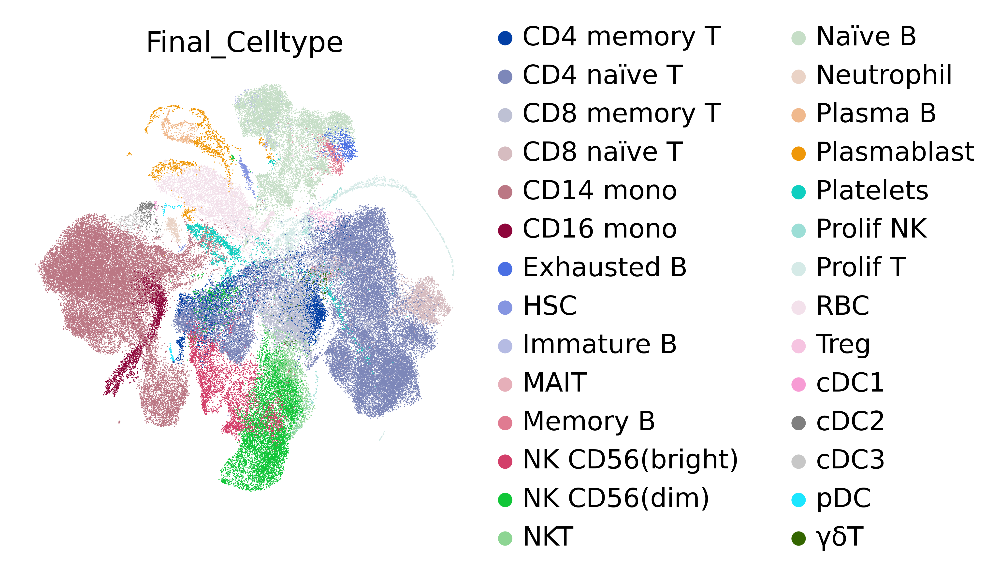

In [10]:
# now have filtered object with TCR, annotation, and donor information
sc.pp.neighbors(adata, use_rep = "tvi_subset_cc", n_neighbors = 10, n_pcs = 64)
sc.tl.umap(adata, random_state = 0)
sc.pl.umap(adata, color = ["Final_Celltype"], frameon = False)

In [11]:
np.unique(adata.obs['sample_names'])

array(['RV8919578', 'RV8919628', 'RV8959683', 'RV8959684', 'RV8959685',
       'RV8959686', 'RV9039354', 'RV9039355', 'RV9039356'], dtype=object)

In [12]:
np.unique(adata.obs['Final_Celltype'])

array(['CD14 mono', 'CD16 mono', 'CD4 memory T', 'CD4 naïve T',
       'CD8 memory T', 'CD8 naïve T', 'Exhausted B', 'HSC', 'Immature B',
       'MAIT', 'Memory B', 'NK CD56(bright)', 'NK CD56(dim)', 'NKT',
       'Naïve B', 'Neutrophil', 'Plasma B', 'Plasmablast', 'Platelets',
       'Prolif NK', 'Prolif T', 'RBC', 'Treg', 'cDC1', 'cDC2', 'cDC3',
       'pDC', 'γδT'], dtype=object)

In [12]:
# subset to only T cells
adata = adata[adata.obs['Final_Celltype'].isin(['CD4 memory T','CD4 naïve T','CD8 memory T','CD8 naïve T','MAIT','NKT','Prolif T','Treg','γδT'])].copy()
adata

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


AnnData object with n_obs × n_vars = 43023 × 22572
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'multi_chain', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_cdr3', 'IR_VJ_2_cdr3', 'IR_VDJ_1_cdr3', 'IR_VDJ_2_cdr3', 'IR_VJ_1_cdr3_nt', 'IR_V

Clonal Expansion

... storing 'receptor_type' as categorical
... storing 'receptor_subtype' as categorical
... storing 'chain_pairing' as categorical


<AxesSubplot:title={'center':'Number of cells in receptor_type by Immune_condition'}, xlabel='receptor_type', ylabel='Number of cells'>

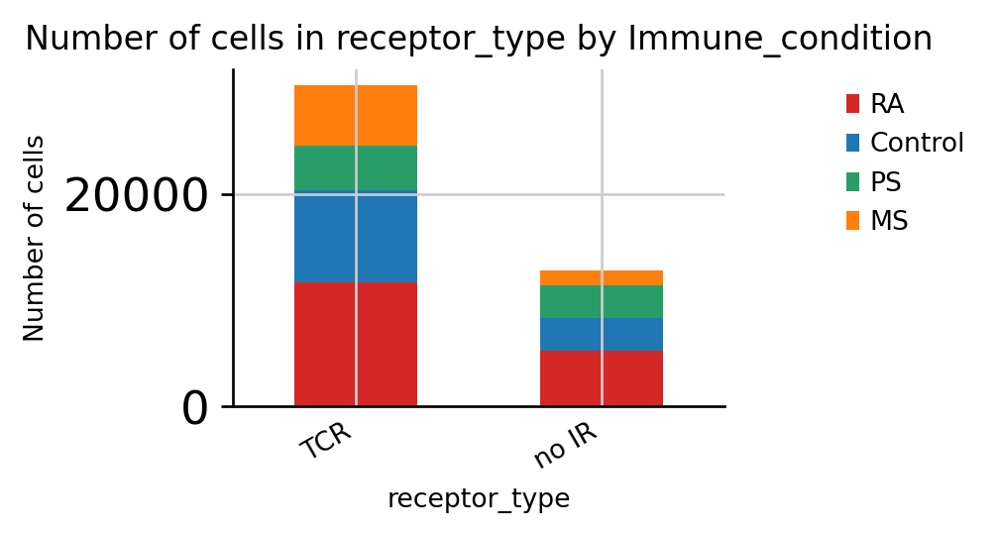

In [13]:
# use the Scirpy toolkit for analysis
ir.tl.chain_qc(adata)
ir.pl.group_abundance(adata, groupby = "receptor_type", target_col = "Immune_condition")

<AxesSubplot:title={'center':'Number of cells in receptor_subtype by Immune_condition'}, xlabel='receptor_subtype', ylabel='Number of cells'>

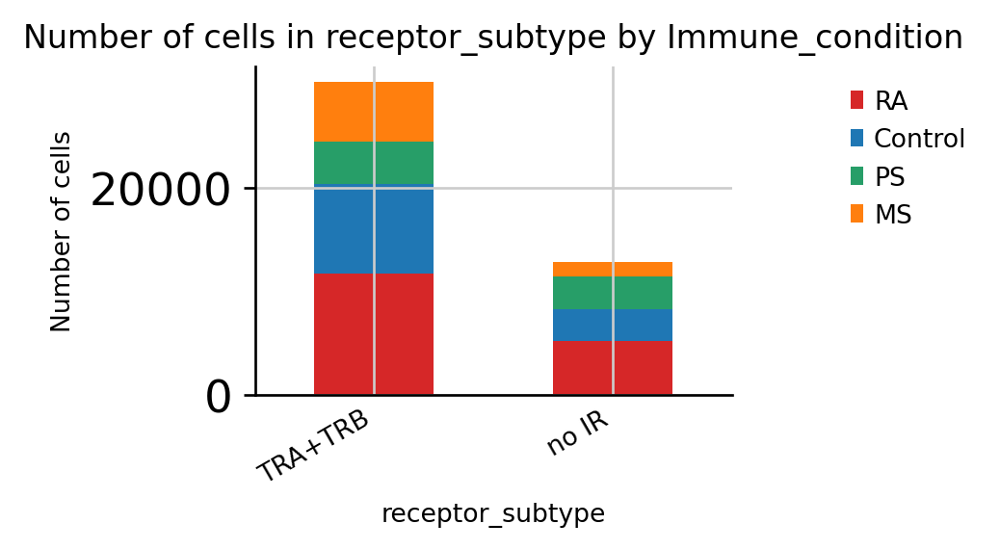

In [15]:
ir.pl.group_abundance(adata, groupby = "receptor_subtype", target_col = "Immune_condition")

<AxesSubplot:title={'center':'Number of cells in chain_pairing by Immune_condition'}, xlabel='chain_pairing', ylabel='Number of cells'>

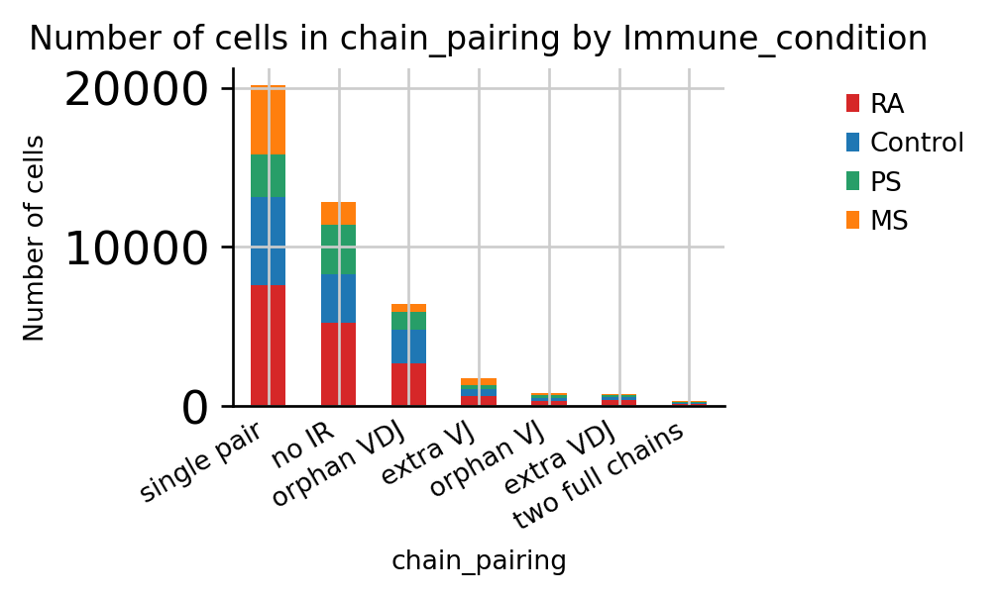

In [14]:
ir.pl.group_abundance(adata, groupby = "chain_pairing", target_col = "Immune_condition")

In [15]:
# have 7% cells with more than one pair
print(
    "Fraction of cells with more than one pair of TCRs: {:.2f}".format(
        np.sum(
            adata.obs["chain_pairing"].isin(
                ["extra VJ", "extra VDJ", "two full chains"]
            )
        )
        / adata.n_obs
    )
)

Fraction of cells with more than one pair of TCRs: 0.07


In [19]:
# exclude multi_chain from downstream analysis
adata = adata[adata.obs["multi_chain"] != "True", :].copy()
adata

AnnData object with n_obs × n_vars = 43023 × 22572
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'multi_chain', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_cdr3', 'IR_VJ_2_cdr3', 'IR_VDJ_1_cdr3', 'IR_VDJ_2_cdr3', 'IR_VJ_1_cdr3_nt', 'IR_V

In [21]:
# define clonotypes using CDR3 nucleic acid sequence identity
ir.pp.ir_neighbors(adata, receptor_arms = "all", dual_ir = "primary_only")
ir.tl.define_clonotypes(adata)

Initializing IrNeighbors object...
Finished initalizing IrNeighbors object.  (0:00:03)
Computing VJ pairwise distances...
Finished computing VJ pairwise distances. (0:00:00)
Computing VDJ pairwise distances...
Finished computing VDJ pairwise distances. (0:00:00)
Started comstructing VJ coord-dictionary...
100%|██████████| 19935/19935 [00:00<00:00, 28634.69it/s]
Finished constructing VJ coord-dictionary (0:00:00)
Started comstructing VDJ coord-dictionary...
100%|██████████| 24770/24770 [00:00<00:00, 38784.29it/s]
Finished constructing VDJ coord-dictionary (0:00:00)
Constructing cell x cell distance matrix...
100%|██████████| 184864/184864 [00:01<00:00, 106622.87it/s]
Finished constructing cell x cell distance matrix.  (0:00:01)


In [22]:
adata

AnnData object with n_obs × n_vars = 43023 × 22572
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'multi_chain', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_cdr3', 'IR_VJ_2_cdr3', 'IR_VDJ_1_cdr3', 'IR_VDJ_2_cdr3', 'IR_VJ_1_cdr3_nt', 'IR_V

... storing 'clonotype' as categorical
... storing 'clonal_expansion' as categorical


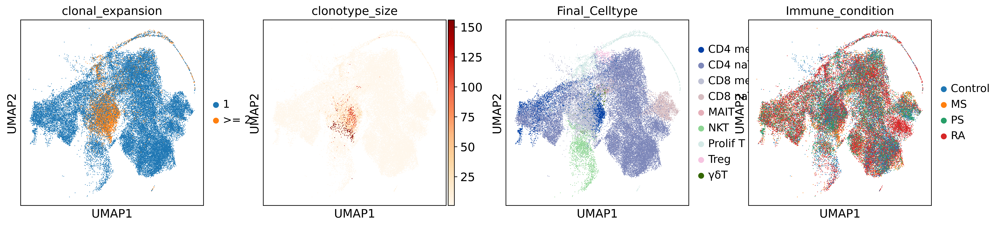

In [23]:
# define expanded clones
ir.tl.clonal_expansion(adata, clip_at = 2)
sc.pl.umap(adata, color = ["clonal_expansion", "clonotype_size", 'Final_Celltype', 'Immune_condition'], cmap = 'OrRd')

<AxesSubplot:>

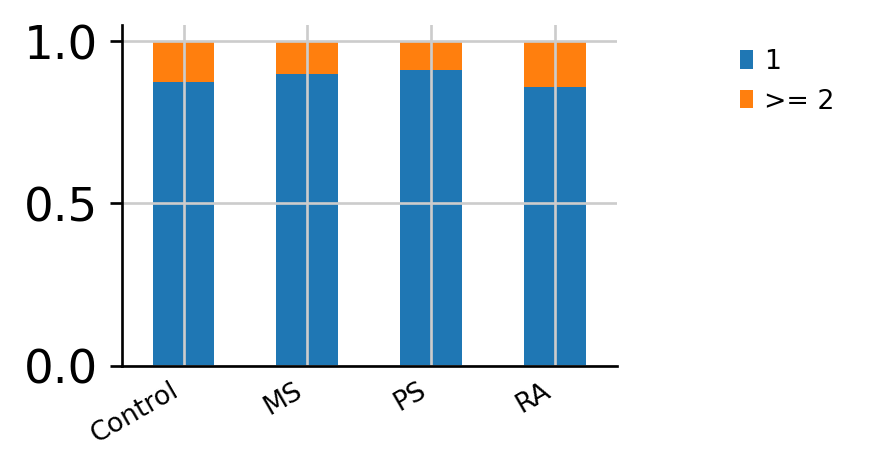

In [24]:
ir.pl.clonal_expansion(adata, groupby = "Immune_condition", clip_at = 2)

<AxesSubplot:>

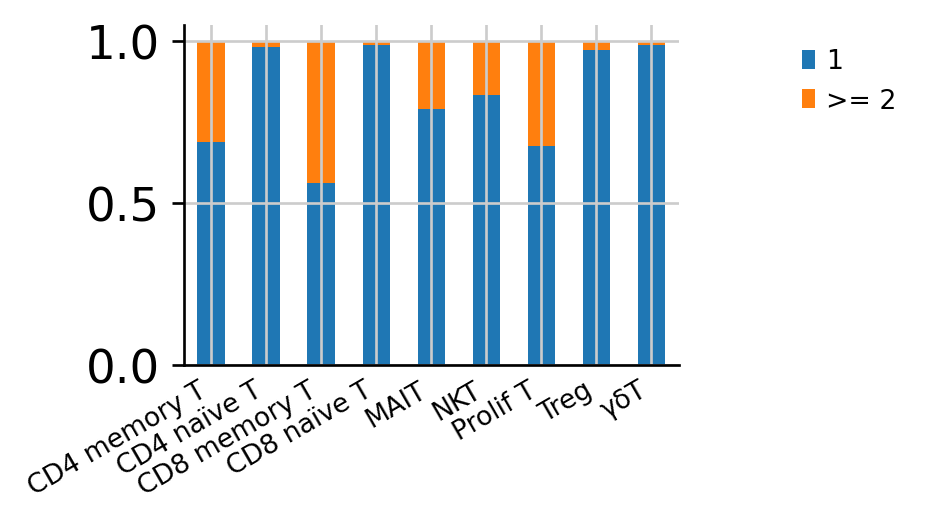

In [25]:
ir.pl.clonal_expansion(adata, groupby = "Final_Celltype", clip_at = 2)

<AxesSubplot:title={'center':'Alpha diversity of clonotype by Final_Celltype'}, ylabel='norm. Shannon entropy'>

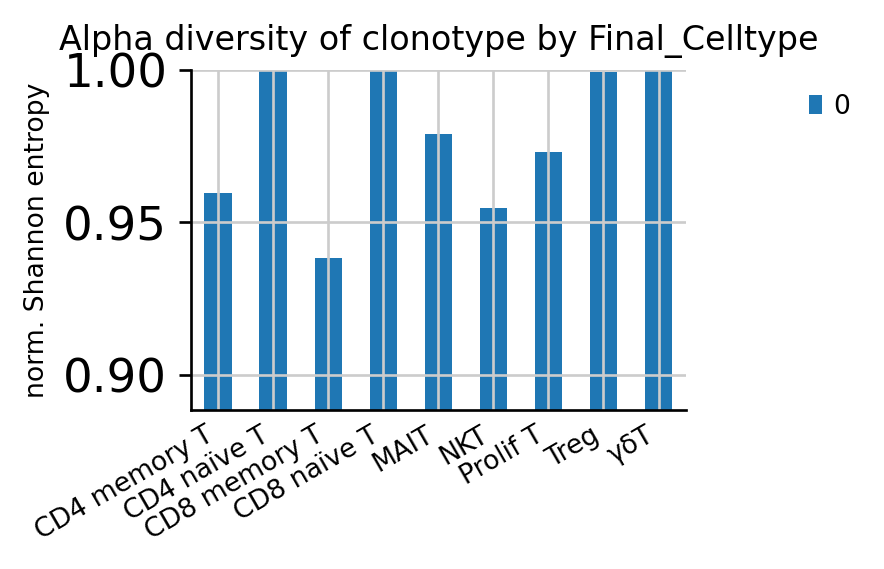

In [26]:
ir.pl.alpha_diversity(adata, groupby = "Final_Celltype")

In [27]:
# add expansion information to the object
adata.obs['Expansion'] = ['Expanded' if value != '1' else 'Single' for value in adata.obs['clonal_expansion']]
adata.obs

,souporcell,demultiplexed,sample_names,log2p1_count,percent_mito,n_genes,batch,FolderName,Lane,Sort,...,Immune_condition,Donor_condition,Final_Celltype,receptor_type,receptor_subtype,chain_pairing,clonotype,clonotype_size,clonal_expansion,Expansion
RV8919578_AAACCTGAGGTGCTAG-1,singlet,CV19-I-O-3,RV8919578,12.726431,0.011068,1975,2,I-O-2_3_C-0,34527_1,None,...,MS,MS2,CD4 naïve T,TCR,TRA+TRB,single pair,0_TCR,1,1,Single
RV8919578_AAACCTGAGTAGGTGC-1,singlet,CV19-I-O-3,RV8919578,12.614710,0.014671,1340,2,I-O-2_3_C-0,34527_1,None,...,MS,MS2,CD4 naïve T,TCR,TRA+TRB,single pair,1_TCR,2,>= 2,Expanded
RV8919578_AAACCTGAGTGGTAAT-1,singlet,CV19-I-O-2,RV8919578,11.311749,0.012593,683,2,I-O-2_3_C-0,34527_1,None,...,MS,MS1,CD4 naïve T,no IR,no IR,no IR,2_no IR,1,1,Single
RV8919578_AAACCTGAGTTCGCAT-1,singlet,CV19-I-O-3,RV8919578,12.993469,0.010302,1946,2,I-O-2_3_C-0,34527_1,None,...,MS,MS2,CD4 naïve T,TCR,TRA+TRB,single pair,3_TCR,1,1,Single
RV8919578_AAACCTGCAGACAGGT-1,singlet,CV19-I-O-3,RV8919578,11.909518,0.061102,1111,2,I-O-2_3_C-0,34527_1,None,...,MS,MS2,CD4 naïve T,no IR,no IR,no IR,4_no IR,1,1,Single
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RV8959686_TTTGGTTGTTGAGTTC-1,singlet,CV19-I-O-71,RV8959686,11.168045,0.044783,794,24,I-O-71_C-0,38186,None,...,PS,PS3,CD4 naïve T,no IR,no IR,no IR,38938_no IR,1,1,Single
RV8959686_TTTGTCAAGCGCCTCA-1,singlet,CV19-I-O-71,RV8959686,12.669106,0.007525,1856,24,I-O-71_C-0,38186,None,...,PS,PS3,CD4 naïve T,TCR,TRA+TRB,single pair,38939_TCR,1,1,Single
RV8959686_TTTGTCACAGCGATCC-1,singlet,CV19-I-O-71,RV8959686,12.699139,0.008272,1348,24,I-O-71_C-0,38186,None,...,PS,PS3,CD4 memory T,no IR,no IR,no IR,38940_no IR,1,1,Single
RV8959686_TTTGTCAGTATGAATG-1,singlet,CV19-I-O-71,RV8959686,11.049168,0.131728,689,24,I-O-71_C-0,38186,None,...,PS,PS3,CD4 naïve T,no IR,no IR,no IR,38941_no IR,1,1,Single


In [28]:
np.unique(adata.obs['receptor_subtype'], return_counts = True)

(array(['TRA+TRB', 'no IR'], dtype=object), array([30224, 12799]))

In [29]:
np.unique(adata.obs['chain_pairing'], return_counts = True)

(array(['extra VDJ', 'extra VJ', 'no IR', 'orphan VDJ', 'orphan VJ',
        'single pair', 'two full chains'], dtype=object),
 array([  776,  1766, 12799,  6417,   785, 20180,   300]))

In [34]:
# save processed data so far
adata.obs.to_csv('./TCR_processed.csv')
adata

AnnData object with n_obs × n_vars = 43023 × 22572
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'multi_chain', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_cdr3', 'IR_VJ_2_cdr3', 'IR_VDJ_1_cdr3', 'IR_VDJ_2_cdr3', 'IR_VJ_1_cdr3_nt', 'IR_V

In [34]:
# remove cells with no IR, orphan VDJ, orphan VJ, and two full chains for analysis
adata = adata[-adata.obs["chain_pairing"].isin(['no IR', 'orphan VDJ', 'orphan VJ', 'two full chains'])].copy()
adata

/opt/conda/lib/python3.8/site-packages/anndata/compat/__init__.py:210: FutureWarning: During AnnData slicing, found matrix at .uns['ir_neighbors_nt_identity']['connectivities'] that happens to be dimensioned at n_obs×n_obs (43023×43023).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/opt/conda/lib/python3.8/site-packages/anndata/compat/__init__.py:210: FutureWarning: During AnnData slicing, found matrix at .uns['ir_neighbors_nt_identity']['distances'] that happens to be dimensioned at n_obs×n_obs (43023×43023).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


AnnData object with n_obs × n_vars = 22722 × 22572
    obs: 'souporcell', 'demultiplexed', 'sample_names', 'log2p1_count', 'percent_mito', 'n_genes', 'batch', 'FolderName', 'Lane', 'Sort', 'Type', 'Donor Id', 'Age', 'Sex', 'Race', 'Ethnicity', 'BMI', 'Pre-existing heart disease', 'Pre-existing lung disease', 'Pre-existing kidney disease', 'Pre-existing diabetes', 'Pre-existing Hypertension', 'Pre-existing immunocompromised condition', 'Smoking', 'SARS-CoV-2 PCR', 'SARS-CoV-2 Ab', 'Symptomatic', 'Admitted to hospital', 'Highest level of respiratory support', 'Vasoactive agents required during hospitalization', '28-day death', 'scrublet_pred', 'scrublet_local_pred', 'scrublet_score', 'scrublet_cluster_score', 'filtered_cells', 'S_score', 'G2M_score', 'phase', 'leiden_sampl_cc', 'leidenres2_sampl_cc', 'DonorSubset', 'multi_chain', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_cdr3', 'IR_VJ_2_cdr3', 'IR_VDJ_1_cdr3', 'IR_VDJ_2_cdr3', 'IR_VJ_1_cdr3_nt', 'IR_V

... storing 'Expansion' as categorical


<AxesSubplot:title={'center':'Number of cells in chain_pairing by Immune_condition'}, xlabel='chain_pairing', ylabel='Number of cells'>

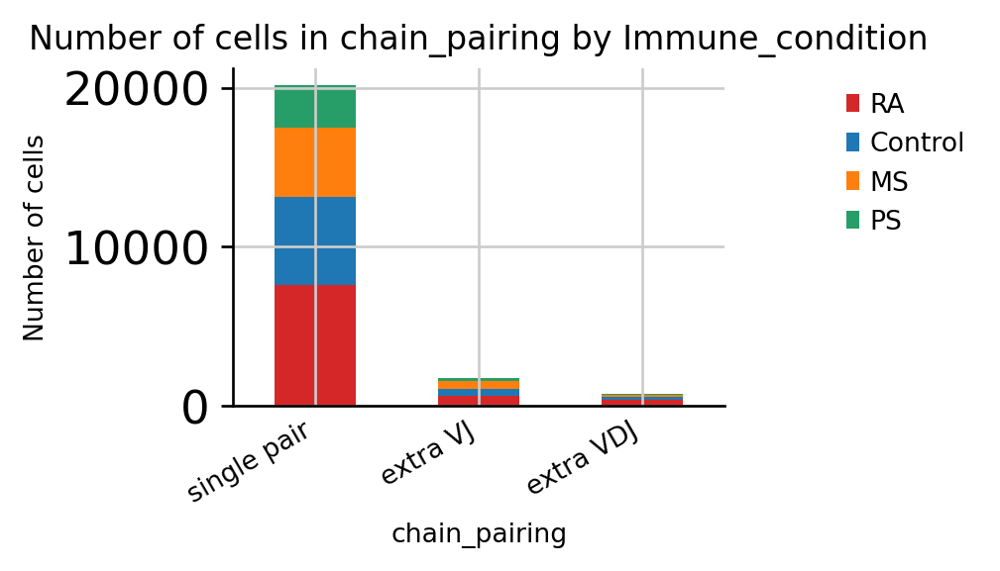

In [35]:
ir.pl.group_abundance(adata, groupby = "chain_pairing", target_col = "Immune_condition")

In [38]:
adata.obs['celltype_expansion'] = [i + '_' + j for i,j in zip(adata.obs['Final_Celltype'], adata.obs['Expansion'])]
np.unique(adata.obs['celltype_expansion'], return_counts = True)

(array(['CD4 memory T_Expanded', 'CD4 memory T_Single',
        'CD4 naïve T_Expanded', 'CD4 naïve T_Single',
        'CD8 memory T_Expanded', 'CD8 memory T_Single',
        'CD8 naïve T_Expanded', 'CD8 naïve T_Single', 'MAIT_Expanded',
        'MAIT_Single', 'NKT_Expanded', 'NKT_Single', 'Prolif T_Expanded',
        'Prolif T_Single', 'Treg_Expanded', 'Treg_Single', 'γδT_Expanded',
        'γδT_Single'], dtype=object),
 array([  795,   275,   376, 14740,  2050,  1017,    24,  1601,    41,
          103,   252,    21,   484,   661,     9,   265,     3,     5]))

In [39]:
# create a dataframe with expanded and single cell numbers for each type by donor
df_stats = pd.DataFrame(columns = list(np.unique(adata.obs['celltype_expansion'])),
                           index = list(np.unique(adata.obs['Donor_condition'])))

for celltype in df_stats.columns:
    for donor in df_stats.index:
        df_stats.loc[donor, celltype] = adata[(adata.obs['Donor_condition'] == donor)
                                         & (adata.obs['celltype_expansion'] == celltype)].X.shape[0]
df_stats

/opt/conda/lib/python3.8/site-packages/anndata/compat/__init__.py:210: FutureWarning: During AnnData slicing, found matrix at .uns['ir_neighbors_nt_identity']['connectivities'] that happens to be dimensioned at n_obs×n_obs (22722×22722).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/opt/conda/lib/python3.8/site-packages/anndata/compat/__init__.py:210: FutureWarning: During AnnData slicing, found matrix at .uns['ir_neighbors_nt_identity']['distances'] that happens to be dimensioned at n_obs×n_obs (22722×22722).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(


,CD4 memory T_Expanded,CD4 memory T_Single,CD4 naïve T_Expanded,CD4 naïve T_Single,CD8 memory T_Expanded,CD8 memory T_Single,CD8 naïve T_Expanded,CD8 naïve T_Single,MAIT_Expanded,MAIT_Single,NKT_Expanded,NKT_Single,Prolif T_Expanded,Prolif T_Single,Treg_Expanded,Treg_Single,γδT_Expanded,γδT_Single
C1,11,4,10,355,84,24,0,151,0,1,10,0,6,38,2,16,0,0
C10,43,15,39,829,258,82,1,55,0,9,10,0,8,19,0,25,0,0
C2,8,11,4,214,47,42,0,18,0,0,1,0,2,30,0,6,0,0
C3,1,3,2,162,13,19,0,33,2,1,1,0,0,8,0,2,0,0
C4,7,5,2,200,52,41,0,13,0,2,1,0,1,6,0,3,0,0
C5,2,4,2,152,12,35,0,36,0,0,0,0,2,11,0,2,0,0
C6,0,4,14,625,22,44,2,66,0,5,0,0,12,17,0,7,0,3
C7,14,6,1,48,36,9,0,5,0,0,1,0,0,4,0,4,0,0
C8,78,15,14,366,169,51,2,16,0,1,2,2,3,31,0,11,0,0
C9,11,5,7,960,55,31,2,19,0,5,11,0,3,42,2,16,0,0


In [41]:
# save final table (now can use to average and plot cell proportions by condition for each type, and perform statistical analysis)
df_stats.to_csv('/home/jovyan/COVID/Tables/TCR_absolute_cell_counts_expanded_and_single_by_donor.csv')

End of Notebook